### Author: Sridharan Chandran

# PROJECT : UNSUPERVISED LEARNING

## Part - A

• **DOMAIN:** Automobile

• **CONTEXT:** The data concerns city-cycle fuel consumption in miles per gallon to be predicted in terms of 3 multivalued discrete and 5
continuous attributes.

• **DATA DESCRIPTION:**

   **cylinders:** multi-valued discrete, 	            **acceleration:** continuous

   **displacement:** continuous,                             **model year:** multi-valued discrete

   **horsepower:** continuous, 	                        **origin:** multi-valued discrete

   **weight:** continuous, 	                            **car name:** string (unique for each instance)

   **mpg:** continuous	

• **PROJECT OBJECTIVE:** To understand K-means Clustering by applying on the Car Dataset to segment the cars into various categories.



### STEPS AND TASK

### 1. Data Understanding & Exploration:

In [123]:
# import all necessary libraries.
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

from sklearn.model_selection  import train_test_split
from sklearn.cluster import KMeans

from scipy.stats import zscore

#### A. Read ‘Car name.csv’ as a DataFrame and assign it to a variable.

In [124]:
# Read the dataset.
Car = pd.read_csv("Car name.csv")
Car.head()

,car_name
0,chevrolet chevelle malibu
1,buick skylark 320
2,plymouth satellite
3,amc rebel sst
4,ford torino


#### B. Read ‘Car-Attributes.json as a DataFrame and assign it to a variable. 

In [125]:
import json # Import json
  
# Opening JSON file
f = open('Car-Attributes.json')
  
# returns JSON object as a dictionary
data = json.load(f)

# Convert the dict to dataframe
Car2 = pd.DataFrame.from_dict(data, orient='columns')
Car2.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin
0,18.0,8,307.0,130,3504,12.0,70,1
1,15.0,8,350.0,165,3693,11.5,70,1
2,18.0,8,318.0,150,3436,11.0,70,1
3,16.0,8,304.0,150,3433,12.0,70,1
4,17.0,8,302.0,140,3449,10.5,70,1


#### C. Merge both the DataFrames together to form a single DataFrame.

In [126]:
print("Car name data shape:",Car.shape)
print("Car attributes data shape:",Car2.shape)

Car name data shape: (398, 1)
Car attributes data shape: (398, 8)


In [127]:
# Merge the both datasets
df = pd.merge(Car,Car2,left_index=True,  right_index=True)
print(df.shape)

(398, 9)


In [128]:
df.head()

,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin
0,chevrolet chevelle malibu,18.0,8,307.0,130,3504,12.0,70,1
1,buick skylark 320,15.0,8,350.0,165,3693,11.5,70,1
2,plymouth satellite,18.0,8,318.0,150,3436,11.0,70,1
3,amc rebel sst,16.0,8,304.0,150,3433,12.0,70,1
4,ford torino,17.0,8,302.0,140,3449,10.5,70,1


#### D. Print 5 point summary of the numerical features and share insights. 

In [129]:
df.min() # Minimum values of features

car_name    amc ambassador brougham
mpg                             9.0
cyl                               3
disp                           68.0
wt                             1613
acc                             8.0
yr                               70
origin                            1
dtype: object

In [130]:
df.quantile(.25) # 1st quartile values of features

mpg         17.500
cyl          4.000
disp       104.250
wt        2223.750
acc         13.825
yr          73.000
origin       1.000
Name: 0.25, dtype: float64

In [131]:
df.median() # 2nd quartile / Median values of the features

mpg         23.0
cyl          4.0
disp       148.5
wt        2803.5
acc         15.5
yr          76.0
origin       1.0
dtype: float64

In [132]:
df.quantile(.75) # 3rd quartile values of features

mpg         29.000
cyl          8.000
disp       262.000
wt        3608.000
acc         17.175
yr          79.000
origin       2.000
Name: 0.75, dtype: float64

In [133]:
df.max() # Maximum values of features

car_name    vw rabbit custom
mpg                     46.6
cyl                        8
disp                   455.0
wt                      5140
acc                     24.8
yr                        82
origin                     3
dtype: object

In [134]:
df.describe().T # Five point summery

,count,mean,std,min,25%,50%,75%,max
mpg,398.0,23.514573,7.815984,9.0,17.500,23.0,29.000,46.6
cyl,398.0,5.454774,1.701004,3.0,4.000,4.0,8.000,8.0
disp,398.0,193.425879,104.269838,68.0,104.250,148.5,262.000,455.0
wt,398.0,2970.424623,846.841774,1613.0,2223.750,2803.5,3608.000,5140.0
acc,398.0,15.568090,2.757689,8.0,13.825,15.5,17.175,24.8
yr,398.0,76.010050,3.697627,70.0,73.000,76.0,79.000,82.0
origin,398.0,1.572864,0.802055,1.0,1.000,1.0,2.000,3.0


#### Insights

In cylinder feature Q1 & Median are same value also Q3 & max value are same value. 

In orgin feature Min value, Q1 & median are same.

we can see the followings,

* cylinder & orgin features are multimodal distribution


* following features are right skewed distribution

  1) "mpg"
  
  2) "disp" 
  
  3) "hp"
  
  4) "wt"


* "acc" feature is normal distribution.

* "yr" feature is uniform distribution.




### 2. Data Preparation & Analysis:

#### A. Check and print feature-wise percentage of missing values present in the data and impute with the best suitable approach. 

In [135]:
# Count the null values

mpg_null = df["mpg"].isnull().sum() 
cyl_null = df["cyl"].isnull().sum()
disp_null = df["disp"].isnull().sum()
hp_null = df["hp"].isnull().sum()
wt_null = df["wt"].isnull().sum()
acc_null = df["acc"].isnull().sum()
yr_null = df["yr"].isnull().sum()
origin_null = df["origin"].isnull().sum()

# Feature-wise null values percentage 
mpg_null_percent = (mpg_null / (len(df)))*100 
cyl_null_percent = (cyl_null / (len(df)))*100 
disp_null_percent = (disp_null / (len(df)))*100 
hp_null_percent = (hp_null / (len(df)))*100 
wt_null_percent = (wt_null / (len(df)))*100 
acc_null_percent = (acc_null / (len(df)))*100
yr_null_percent = (yr_null / (len(df)))*100 
origin_null_percent = (origin_null / (len(df)))*100 


print("mpg - Percentage of null values:",mpg_null_percent,"%")
print("cyl - Percentage of null values:",cyl_null_percent,"%")
print("disp - Percentage of null values:",disp_null_percent,"%")
print("hp - Percentage of null values:",hp_null_percent,"%")
print("wt - Percentage of null values:",wt_null_percent,"%")
print("acc - Percentage of null values:",acc_null_percent,"%")
print("yr - Percentage of null values:",yr_null_percent,"%")
print("origin - Percentage of null values:",origin_null_percent,"%")


mpg - Percentage of null values: 0.0 %
cyl - Percentage of null values: 0.0 %
disp - Percentage of null values: 0.0 %
hp - Percentage of null values: 0.0 %
wt - Percentage of null values: 0.0 %
acc - Percentage of null values: 0.0 %
yr - Percentage of null values: 0.0 %
origin - Percentage of null values: 0.0 %


In [136]:
# Print the dataframe information.
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   car_name  398 non-null    object 
 1   mpg       398 non-null    float64
 2   cyl       398 non-null    int64  
 3   disp      398 non-null    float64
 4   hp        398 non-null    object 
 5   wt        398 non-null    int64  
 6   acc       398 non-null    float64
 7   yr        398 non-null    int64  
 8   origin    398 non-null    int64  
dtypes: float64(3), int64(4), object(2)
memory usage: 28.1+ KB


*There is no null value in the dataset.*

#### B. Check for duplicate values in the data and impute with the best suitable approach.

In [137]:
# Lets check the duplicated values in the dataframe

duplicates = df.duplicated()
duplicates.sum()

0

There is no duplicate values in the dataframe.

#### C. Plot a pairplot for all features

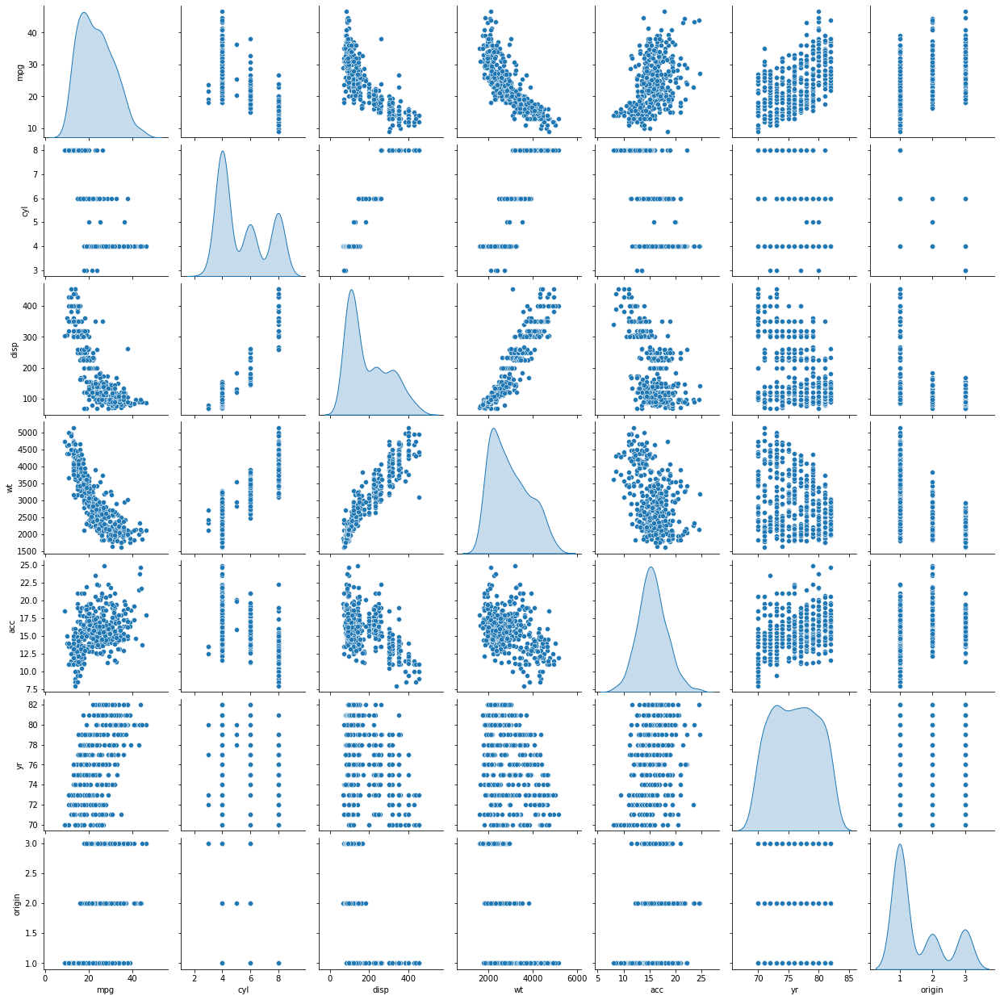

In [138]:
# Visuvalizing the correlation of attributes.
sns.pairplot(df,diag_kind='kde');

#### D. Visualize a scatterplot for ‘wt’ and ‘disp’. Datapoints should be distinguishable by ‘cyl’.

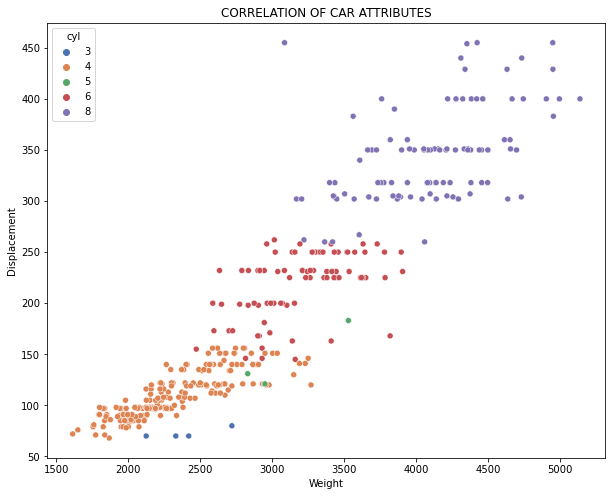

In [139]:
plt.figure(figsize=(10,8))
plt.xlabel("Weight")
plt.ylabel("Displacement")
plt.title("CORRELATION OF CAR ATTRIBUTES")
sns.scatterplot(x=df["wt"], y=df["disp"],hue=df["cyl"],palette="deep");

#### E. Share insights for Q2.d.

**The weight & displacement attributes are positively correlated.** We can see that when increase the no. of cylinders it can increase the displacement of the car and also increase the weight of cars.

1. Cars with 3 cylinder have weights in the range between 2100-2700 & displacement between 60-70.
2. Cars with 4 cylinder have weights in the range between 1600-3000 & displacement between 60-120.
3. Cars with 5 cylinder have weights in the range between 2200-3500 & displacement between 100-160.
4. Cars with 6 cylinder have weights in the range between 2500-4000 & displacement between 150-260.
5. Cars with 8 cylinder have weights in the range between 3000-5100 & displacement between 260-460.

#### F. Visualize a scatterplot for ‘wt’ and ’mpg’. Datapoints should be distinguishable by ‘cyl’.

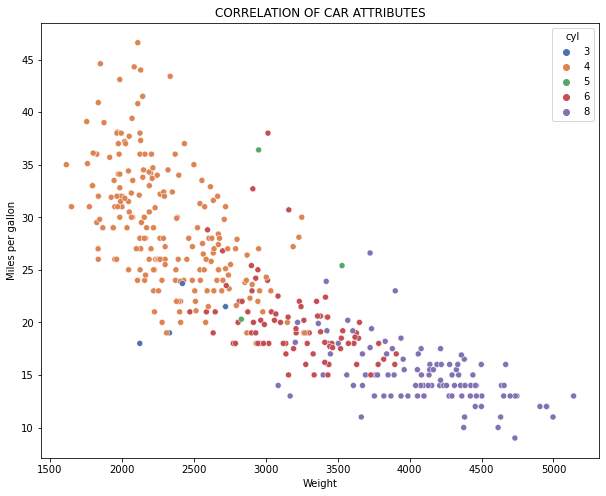

In [140]:
plt.figure(figsize=(10,8))
plt.xlabel("Weight")
plt.ylabel("Miles per gallon")
plt.title("CORRELATION OF CAR ATTRIBUTES")
sns.scatterplot(x=df["wt"], y=df["mpg"],hue=df["cyl"],palette="deep");

#### G. Share insights for Q2.f.

**The weight & mpg attributes are negatively correlated.** We can see that when increasing the no. of cylinders causes increase the weight of cars which effect to decrease mpg of the car.

1. Cars with 3 cylinder have weights in the range between 2000-2700 & mpg between 17-25.
2. Cars with 4 cylinder have weights in the range between 1600-3000 & mpg between 30-45.
3. Cars with 5 cylinder have weights in the range between 2200-3500 & mpg between 20-35.
4. Cars with 6 cylinder have weights in the range between 2500-4000 & mpg between 15-30.
5. Cars with 8 cylinder have weights in the range between 3000-5100 & mpg between 10-20.

#### H. Check for unexpected values in all the features and datapoints with such values. 

In [141]:
df.info() # Check the non numerical features in the dataframe.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   car_name  398 non-null    object 
 1   mpg       398 non-null    float64
 2   cyl       398 non-null    int64  
 3   disp      398 non-null    float64
 4   hp        398 non-null    object 
 5   wt        398 non-null    int64  
 6   acc       398 non-null    float64
 7   yr        398 non-null    int64  
 8   origin    398 non-null    int64  
dtypes: float64(3), int64(4), object(2)
memory usage: 28.1+ KB


We can see that all the feature are numeric datatype except the"car_name" & "hp" features. We have to check the unexpected values in "hp" feature.

In [142]:
# Finding the unexpected values in the dataframe.

df[~df.iloc[:,1:].applymap(np.isreal).all(1)]

,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin
32,ford pinto,25.0,4,98.0,?,2046,19.0,71,1
126,ford maverick,21.0,6,200.0,?,2875,17.0,74,1
330,renault lecar deluxe,40.9,4,85.0,?,1835,17.3,80,2
336,ford mustang cobra,23.6,4,140.0,?,2905,14.3,80,1
354,renault 18i,34.5,4,100.0,?,2320,15.8,81,2
374,amc concord dl,23.0,4,151.0,?,3035,20.5,82,1


There are some unexpected value "?" in the "hp" feature. We have to drop them to do analysis.

In [143]:
# Replace the unexpected value to null value.

df["hp"].replace("?",np.nan,inplace=True)

In [144]:
# Count the null values.

df["hp"].isnull().sum()

6

In [145]:
#Drop the null values.

df.dropna(inplace=True)
df.shape

(392, 9)

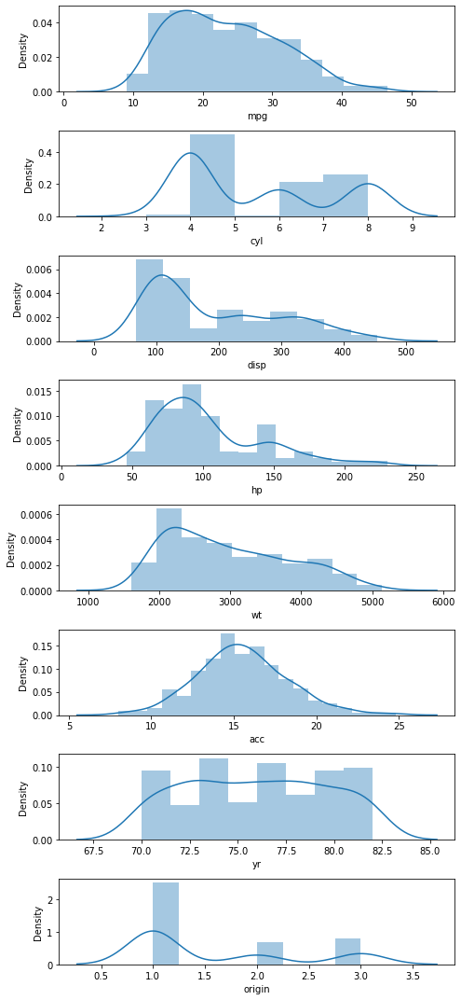

In [146]:
# Visualize the distribution of the features

col = list(df)[1:] # Excluding Names column which has only 

#histograms for numerical data
fig, ax = plt.subplots(len(col),figsize=(7,15))
index=np.arange(len(col))
for column,i in zip(col,index):
    sns.distplot(df[column],ax=ax[i]);

fig.tight_layout()
plt.show()

### Outlier treatment

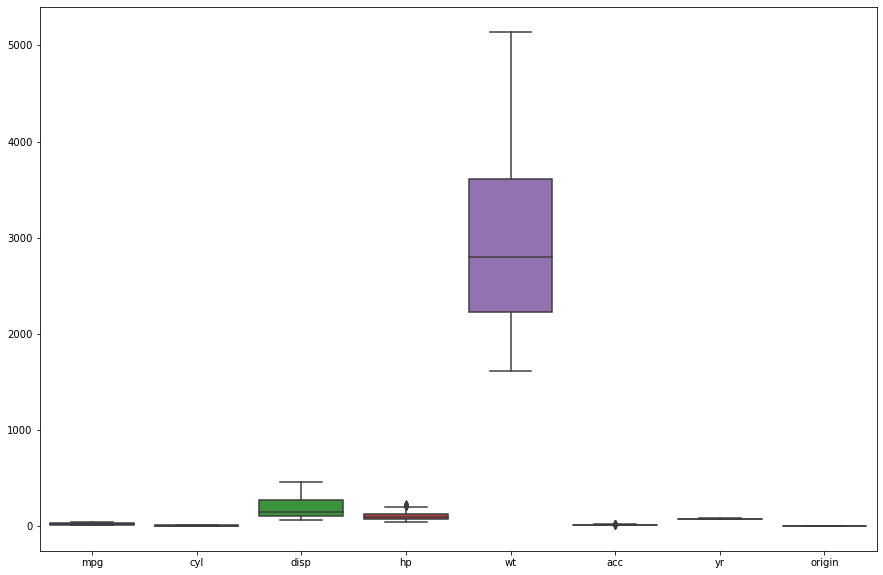

In [147]:
# Lets visualize features with boxplot.
plt.figure(figsize=(15,10))
sns.boxplot(data=df);

In [148]:
# Lets calculate the lower & upper bound of of data distribution for outlier treatment.

Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3-Q1
Lower_bound = Q1-(1.5*IQR)
Upper_bound = Q3+(1.5*IQR)
print("Minimum values are: \n",df.min())
print("\nLower bound values are: \n",Lower_bound)
print("\nMaximum values are: \n",df.max())
print("\nUpper bound values are: \n",Upper_bound)

Minimum values are: 
 car_name    amc ambassador brougham
mpg                             9.0
cyl                               3
disp                           68.0
hp                             46.0
wt                             1613
acc                             8.0
yr                               70
origin                            1
dtype: object

Lower bound values are: 
 mpg        -1.000
cyl        -2.000
disp     -151.125
hp         -1.500
wt        141.000
acc         8.900
yr         64.000
origin     -0.500
dtype: float64

Maximum values are: 
 car_name    vw rabbit custom
mpg                     46.6
cyl                        8
disp                   455.0
hp                     230.0
wt                      5140
acc                     24.8
yr                        82
origin                     3
dtype: object

Upper bound values are: 
 mpg         47.000
cyl         14.000
disp       531.875
hp         202.500
wt        5699.000
acc         21.900
yr          88.

According to our calculations, we find that "acc" & "hp" features have outliers. Let's visualize the feature for better understanding.

In [149]:
# Replace the all outlier values to median value.

df["hp"] = np.where(df["hp"]>Upper_bound["hp"],df["hp"].median(),df["hp"])
df["acc"] = np.where(df["acc"]>Upper_bound["acc"],df["acc"].median(),df["acc"])
df["acc"] = np.where(df["acc"]<Lower_bound["acc"],df["acc"].median(),df["acc"])

In [150]:
df.describe().T # Lets check the 5 points summery.

,count,mean,std,min,25%,50%,75%,max
mpg,392.0,23.445918,7.805007,9.0,17.00,22.75,29.00,46.6
cyl,392.0,5.471939,1.705783,3.0,4.00,4.00,8.00,8.0
disp,392.0,194.411990,104.644004,68.0,105.00,151.00,275.75,455.0
hp,392.0,101.272959,33.747115,46.0,75.00,93.25,115.00,200.0
wt,392.0,2977.584184,849.402560,1613.0,2225.25,2803.50,3614.75,5140.0
acc,392.0,15.440561,2.449607,9.0,13.90,15.50,17.00,21.8
yr,392.0,75.979592,3.683737,70.0,73.00,76.00,79.00,82.0
origin,392.0,1.576531,0.805518,1.0,1.00,1.00,2.00,3.0


### Data standardization

In [151]:
# Scale the attributes
X = df.iloc[:,1:]
XScaled = X.apply(zscore)

In [152]:
XScaled.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin
0,-0.698638,1.483947,1.077290,0.852332,0.620540,-1.406331,-1.625315,-0.716641
1,-1.083498,1.483947,1.488732,1.890783,0.843334,-1.610706,-1.625315,-0.716641
2,-0.698638,1.483947,1.182542,1.445733,0.540382,-1.815081,-1.625315,-0.716641
3,-0.955212,1.483947,1.048584,1.445733,0.536845,-1.406331,-1.625315,-0.716641
4,-0.826925,1.483947,1.029447,1.149033,0.555706,-2.019456,-1.625315,-0.716641


### 3. Clustering: 

#### A. Apply K-Means clustering for 2 to 10 clusters

In [153]:
# Apply K-Means clustering for 2.

kmeans2 = KMeans(n_clusters=2, random_state=42)
kmeans2.fit(XScaled)
kmeans2.inertia_

1568.0944425333053

In [154]:
# Apply K-Means clustering for 3.

kmeans3 = KMeans(n_clusters=3, random_state=42)
kmeans3.fit(XScaled)
kmeans3.inertia_

1191.1449520397136

In [155]:
# Apply K-Means clustering for 4.

kmeans4 = KMeans(n_clusters=4, random_state=42)
kmeans4.fit(XScaled)
kmeans4.inertia_

990.91793509836

In [156]:
# Apply K-Means clustering for 5.

kmeans5 = KMeans(n_clusters=5, random_state=42)
kmeans5.fit(XScaled)
kmeans5.inertia_

838.1448887360536

In [157]:
# Apply K-Means clustering for 6.

kmeans6 = KMeans(n_clusters=6, random_state=42)
kmeans6.fit(XScaled)
kmeans6.inertia_

764.6815454359747

In [158]:
# Apply K-Means clustering for 7.

kmeans7 = KMeans(n_clusters=7, random_state=42)
kmeans7.fit(XScaled)
kmeans7.inertia_

708.8541259879544

In [159]:
# Apply K-Means clustering for 8.

kmeans8 = KMeans(n_clusters=8, random_state=42)
kmeans8.fit(XScaled)
kmeans8.inertia_

666.5331890724393

In [160]:
# Apply K-Means clustering for 9.

kmeans9 = KMeans(n_clusters=9, random_state=42)
kmeans9.fit(XScaled)
kmeans9.inertia_

629.2299691267001

In [161]:
# Apply K-Means clustering for 10.

kmeans10 = KMeans(n_clusters=10, random_state=42)
kmeans10.fit(XScaled)
kmeans10.inertia_

584.9182251813035

**We can see that WCSS reduces as K keeps increasing.**

#### B. Plot a visual and find elbow point.

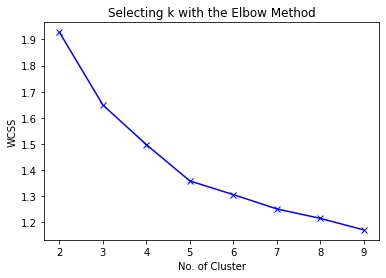

In [162]:
#Finding optimal no. of clusters
from scipy.spatial.distance import cdist
clusters=range(2,10)
meanDistortions=[]

for k in clusters:
    model=KMeans(n_clusters=k)
    model.fit(XScaled)
    prediction=model.predict(XScaled)
    meanDistortions.append(sum(np.min(cdist(XScaled, model.cluster_centers_, 'euclidean'), axis=1)) / XScaled.shape[0])


plt.plot(clusters, meanDistortions, 'bx-');
plt.xlabel('No. of Cluster')
plt.ylabel('WCSS')
plt.title('Selecting k with the Elbow Method');

#### C. On the above visual, highlight which are the possible Elbow points

On the above visualization, we can see that K=5 is the possible elbow point.

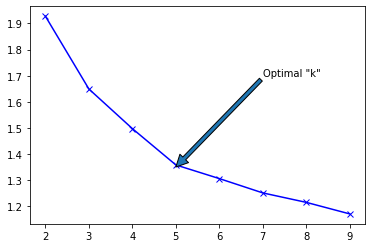

In [163]:
fig, ax = plt.subplots()

x = range(2, 10)
y = range(1,2)
ax.plot(clusters, meanDistortions, 'bx-')

ax.annotate('Optimal "k"', xy=(5, 1.35), xytext=(7, 1.7),
            arrowprops=dict());

#### D. Train a K-means clustering model once again on the optimal number of clusters. 

In [164]:
# Apply K-Means clustering for 5.

kmeans5 = KMeans(n_clusters=5, random_state=42)
kmeans5.fit(XScaled)
kmeans5.inertia_

838.1448887360536

#### E. Add a new feature in the DataFrame which will have labels based upon cluster value

In [165]:
df1 = df.copy(deep=True) # deep copy of the dataframe.

In [166]:
df1.head()

,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin
0,chevrolet chevelle malibu,18.0,8,307.0,130.0,3504,12.0,70,1
1,buick skylark 320,15.0,8,350.0,165.0,3693,11.5,70,1
2,plymouth satellite,18.0,8,318.0,150.0,3436,11.0,70,1
3,amc rebel sst,16.0,8,304.0,150.0,3433,12.0,70,1
4,ford torino,17.0,8,302.0,140.0,3449,10.5,70,1


In [167]:
#Append the prediction 
prediction=kmeans5.fit_predict(XScaled)
df1["GROUP"] = prediction
print("Groups Assigned : \n")
df1[["car_name", "GROUP"]].sample(5)

Groups Assigned : 



,car_name,GROUP
266,chevrolet chevette,2
274,audi 5000,1
325,vw rabbit c (diesel),3
173,datsun 710,1
117,fiat 128,1


In [168]:
df1.GROUP.value_counts()

0    97
1    84
4    78
3    72
2    61
Name: GROUP, dtype: int64

In [169]:
df1.groupby(by="GROUP",sort=True).apply(display)

,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin,GROUP
0,chevrolet chevelle malibu,18.0,8,307.0,130.0,3504,12.0,70,1,0
1,buick skylark 320,15.0,8,350.0,165.0,3693,11.5,70,1,0
2,plymouth satellite,18.0,8,318.0,150.0,3436,11.0,70,1,0
3,amc rebel sst,16.0,8,304.0,150.0,3433,12.0,70,1,0
4,ford torino,17.0,8,302.0,140.0,3449,10.5,70,1,0
...,...,...,...,...,...,...,...,...,...,...
287,mercury grand marquis,16.5,8,351.0,138.0,3955,13.2,79,1,0
288,dodge st. regis,18.2,8,318.0,135.0,3830,15.2,79,1,0
289,buick estate wagon (sw),16.9,8,350.0,155.0,4360,14.9,79,1,0
290,ford country squire (sw),15.5,8,351.0,142.0,4054,14.3,79,1,0


,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin,GROUP
14,toyota corona mark ii,24.0,4,113.0,95.0,2372,15.0,70,3,1
18,datsun pl510,27.0,4,97.0,88.0,2130,14.5,70,3,1
19,volkswagen 1131 deluxe sedan,26.0,4,97.0,46.0,1835,20.5,70,2,1
20,peugeot 504,25.0,4,110.0,87.0,2672,17.5,70,2,1
21,audi 100 ls,24.0,4,107.0,90.0,2430,14.5,70,2,1
...,...,...,...,...,...,...,...,...,...,...
243,mazda rx-4,21.5,3,80.0,110.0,2720,13.5,77,3,1
270,toyota celica gt liftback,21.1,4,134.0,95.0,2515,14.8,78,3,1
273,datsun 200-sx,23.9,4,119.0,97.0,2405,14.9,78,3,1
274,audi 5000,20.3,5,131.0,103.0,2830,15.9,78,2,1


,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin,GROUP
168,ford pinto,23.0,4,140.0,83.0,2639,17.0,75,1,2
170,pontiac astro,23.0,4,140.0,78.0,2592,18.5,75,1,2
184,capri ii,25.0,4,140.0,92.0,2572,14.9,76,1,2
185,dodge colt,26.0,4,98.0,79.0,2255,17.7,76,1,2
195,chevrolet chevette,29.0,4,85.0,52.0,2035,15.5,76,1,2
...,...,...,...,...,...,...,...,...,...,...
392,chevrolet camaro,27.0,4,151.0,90.0,2950,17.3,82,1,2
393,ford mustang gl,27.0,4,140.0,86.0,2790,15.6,82,1,2
395,dodge rampage,32.0,4,135.0,84.0,2295,11.6,82,1,2
396,ford ranger,28.0,4,120.0,79.0,2625,18.6,82,1,2


,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin,GROUP
129,datsun b210,31.0,4,79.0,67.0,1950,19.0,74,3,3
131,toyota corolla 1200,32.0,4,71.0,65.0,1836,21.0,74,3,3
144,toyota corona,31.0,4,76.0,52.0,1649,16.5,74,3,3
145,datsun 710,32.0,4,83.0,61.0,2003,19.0,74,3,3
181,honda civic cvcc,33.0,4,91.0,53.0,1795,17.5,75,3,3
...,...,...,...,...,...,...,...,...,...,...
383,honda civic,38.0,4,91.0,67.0,1965,15.0,82,3,3
384,honda civic (auto),32.0,4,91.0,67.0,1965,15.7,82,3,3
385,datsun 310 gx,38.0,4,91.0,67.0,1995,16.2,82,3,3
390,toyota celica gt,32.0,4,144.0,96.0,2665,13.9,82,3,3


,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin,GROUP
15,plymouth duster,22.0,6,198.0,95.0,2833,15.5,70,1,4
16,amc hornet,18.0,6,199.0,97.0,2774,15.5,70,1,4
17,ford maverick,21.0,6,200.0,85.0,2587,16.0,70,1,4
24,amc gremlin,21.0,6,199.0,90.0,2648,15.0,70,1,4
33,amc gremlin,19.0,6,232.0,100.0,2634,13.0,71,1,4
...,...,...,...,...,...,...,...,...,...,...
363,buick century,22.4,6,231.0,110.0,3415,15.8,81,1,4
364,oldsmobile cutlass ls,26.6,8,350.0,105.0,3725,19.0,81,1,4
365,ford granada gl,20.2,6,200.0,88.0,3060,17.1,81,1,4
366,chrysler lebaron salon,17.6,6,225.0,85.0,3465,16.6,81,1,4


""


#### F. Plot a visual and color the datapoints based upon clusters. 

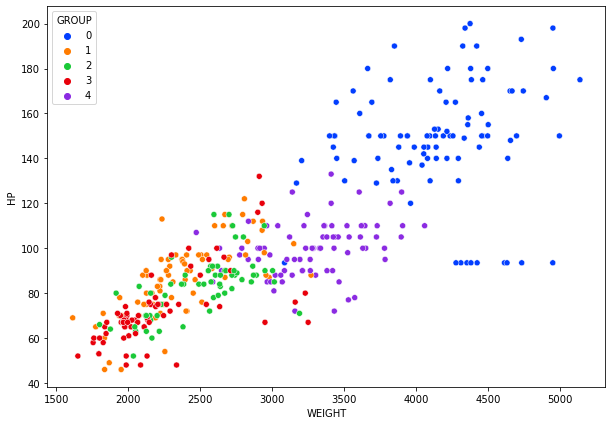

In [170]:
plt.figure(figsize=(10,7))
plt.xlabel("WEIGHT",)
plt.ylabel("HP")
sns.scatterplot(x=df1["wt"], y=df1["hp"], hue=df1.GROUP,palette="bright" );

#### G. Pass a new DataPoint and predict which cluster it belongs to. 

In [171]:
# Saving the model into pickle

# import library
import pickle

In [172]:
# create an iterator object with write permission - Kmeans Cluster as Kmeans_model_pkl.pkl
with open('Kmeans_model_pkl', 'wb') as files:
    pickle.dump(kmeans5, files)

In [173]:
# load saved model
with open('Kmeans_model_pkl', 'rb') as f:
    Kmeans= pickle.load(f)

In [174]:
Kmeans.cluster_centers_ # Clusters cendroids

array([[-1.14393843,  1.47184414,  1.46979213,  1.41269816,  1.37493755,
        -1.05362555, -0.63895177, -0.71664105],
       [ 0.14881683, -0.83606164, -0.81868181, -0.46162633, -0.73756657,
         0.1824431 , -0.70310143,  0.68915924],
       [ 0.71083186, -0.76778566, -0.60910555, -0.54118648, -0.55978892,
         0.18511546,  0.9813911 , -0.69626361],
       [ 1.35287831, -0.79879243, -0.89088162, -0.86770545, -0.91827186,
         0.50911902,  0.94555817,  1.45864991],
       [-0.5423919 ,  0.40779843,  0.35254295, -0.03548643,  0.36986343,
         0.49907494, -0.08854107, -0.65289626]])

In [175]:
# New data points for prediction
data_point1 = [[5, 9, 60, 180, 1500, 20, 70, 4]]
data_point2 = [[20, 7, 450, 10,1000, 10, 80, 1]]
data_point3 = [[9, 3, 68, 46, 1613, 9, 70, 0]]
data_point4 = [[44, 4,97, 52, 2130, 15.5, 82, 2]]
data_point5 = [[15, 6, 108, 56, 2613, 11, 75, 3]]

# Merge the data points
list1= list(data_point1+data_point2+data_point3+data_point4+data_point5)

In [176]:
col = list(df1.columns)
col.pop(0)
col.pop(-1)

col

['mpg', 'cyl', 'disp', 'hp', 'wt', 'acc', 'yr', 'origin']

In [177]:
# Dataframe sample for prediction
sample = pd.DataFrame(list1,columns=col)
sample

,mpg,cyl,disp,hp,wt,acc,yr,origin
0,5,9,60,180,1500,20.0,70,4
1,20,7,450,10,1000,10.0,80,1
2,9,3,68,46,1613,9.0,70,0
3,44,4,97,52,2130,15.5,82,2
4,15,6,108,56,2613,11.0,75,3


In [178]:
Data_pred = Kmeans.fit_predict(sample)
print("Predicted clusters are",Data_pred)

Predicted clusters are [2 1 4 0 3]


In [179]:
sample["CLUSTER"]=Data_pred

In [180]:
sample # The datapoints with predicted clusters

,mpg,cyl,disp,hp,wt,acc,yr,origin,CLUSTER
0,5,9,60,180,1500,20.0,70,4,2
1,20,7,450,10,1000,10.0,80,1,1
2,9,3,68,46,1613,9.0,70,0,4
3,44,4,97,52,2130,15.5,82,2,0
4,15,6,108,56,2613,11.0,75,3,3


## Conclusion
K-Means clustering is a simple yet very effective unsupervised machine learning algorithm for data clustering. It clusters data based on the Euclidean distance between data points. K-Means clustering algorithm has many uses for grouping text documents, images, videos, and much more.


# Part - B 

**• DOMAIN:** Automobile

**• CONTEXT:** The purpose is to classify a given silhouette as one of three types of vehicle, using a set of features extracted from the silhouette. The vehicle may be viewed from one of many different angles.

**• DATA DESCRIPTION:** The data contains features extracted from the silhouette of vehicles in different angles. Four "Corgie" model vehicles were used for the experiment: a double decker bus, Cheverolet van, Saab 9000 and an Opel Manta 400 cars. This particular combination of vehicles was chosen with the expectation that the bus, van and either one of the cars would be readily distinguishable, but it would be more difficult to distinguish between the cars.

• All the features are numeric i.e. geometric features extracted from the silhouette.

**• PROJECT OBJECTIVE:** Apply dimensionality reduction technique – PCA and train a model and compare relative results.

### • STEPS AND TASK

### 1. Data Understanding & Cleaning:

In [181]:
# import all necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from scipy.stats import zscore

from sklearn.model_selection  import train_test_split

#### A. Read ‘vehicle.csv’ and save as DataFrame. 

In [182]:
# Read the dataset

vhl = pd.read_csv("vehicle.csv")
vhl.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus


#### B. Check percentage of missing values and impute with correct approach. 

In [183]:
vhl.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   compactness                  846 non-null    int64  
 1   circularity                  841 non-null    float64
 2   distance_circularity         842 non-null    float64
 3   radius_ratio                 840 non-null    float64
 4   pr.axis_aspect_ratio         844 non-null    float64
 5   max.length_aspect_ratio      846 non-null    int64  
 6   scatter_ratio                845 non-null    float64
 7   elongatedness                845 non-null    float64
 8   pr.axis_rectangularity       843 non-null    float64
 9   max.length_rectangularity    846 non-null    int64  
 10  scaled_variance              843 non-null    float64
 11  scaled_variance.1            844 non-null    float64
 12  scaled_radius_of_gyration    844 non-null    float64
 13  scaled_radius_of_gyr

In [184]:
# Finding the percentage of missing values.

null_percent = round(((vhl.isnull().sum())/vhl.shape[0])*100,2)

print("No. of missing values feature-wise:\n \n",vhl.isnull().sum(),"\n")
print("Percentage of missing values of feature-wise are below:\n \n",null_percent)

No. of missing values feature-wise:
 
 compactness                    0
circularity                    5
distance_circularity           4
radius_ratio                   6
pr.axis_aspect_ratio           2
max.length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  1
pr.axis_rectangularity         3
max.length_rectangularity      0
scaled_variance                3
scaled_variance.1              2
scaled_radius_of_gyration      2
scaled_radius_of_gyration.1    4
skewness_about                 6
skewness_about.1               1
skewness_about.2               1
hollows_ratio                  0
class                          0
dtype: int64 

Percentage of missing values of feature-wise are below:
 
 compactness                    0.00
circularity                    0.59
distance_circularity           0.47
radius_ratio                   0.71
pr.axis_aspect_ratio           0.24
max.length_aspect_ratio        0.00
scatter_ratio                  0.12
elongate

In [185]:
# Fill null values with median value.

vhl["circularity"].fillna(vhl["circularity"].median(),inplace=True)
vhl["distance_circularity"].fillna(vhl["distance_circularity"].median(),inplace=True)
vhl["radius_ratio"].fillna(vhl["radius_ratio"].median(),inplace=True)
vhl["pr.axis_aspect_ratio"].fillna(vhl["pr.axis_aspect_ratio"].median(),inplace=True)
vhl["scatter_ratio"].fillna(vhl["scatter_ratio"].median(),inplace=True)
vhl["elongatedness"].fillna(vhl["elongatedness"].median(),inplace=True)
vhl["pr.axis_rectangularity"].fillna(vhl["pr.axis_rectangularity"].median(),inplace=True)
vhl["scaled_variance"].fillna(vhl["scaled_variance"].median(),inplace=True)
vhl["scaled_variance.1"].fillna(vhl["scaled_variance.1"].median(),inplace=True)
vhl["scaled_radius_of_gyration"].fillna(vhl["scaled_radius_of_gyration"].median(),inplace=True)
vhl["scaled_radius_of_gyration.1"].fillna(vhl["scaled_radius_of_gyration.1"].median(),inplace=True)
vhl["skewness_about"].fillna(vhl["skewness_about"].median(),inplace=True)
vhl["skewness_about.1"].fillna(vhl["skewness_about.1"].median(),inplace=True)
vhl["skewness_about.2"].fillna(vhl["skewness_about.2"].median(),inplace=True)

In [186]:
vhl.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   compactness                  846 non-null    int64  
 1   circularity                  846 non-null    float64
 2   distance_circularity         846 non-null    float64
 3   radius_ratio                 846 non-null    float64
 4   pr.axis_aspect_ratio         846 non-null    float64
 5   max.length_aspect_ratio      846 non-null    int64  
 6   scatter_ratio                846 non-null    float64
 7   elongatedness                846 non-null    float64
 8   pr.axis_rectangularity       846 non-null    float64
 9   max.length_rectangularity    846 non-null    int64  
 10  scaled_variance              846 non-null    float64
 11  scaled_variance.1            846 non-null    float64
 12  scaled_radius_of_gyration    846 non-null    float64
 13  scaled_radius_of_gyr

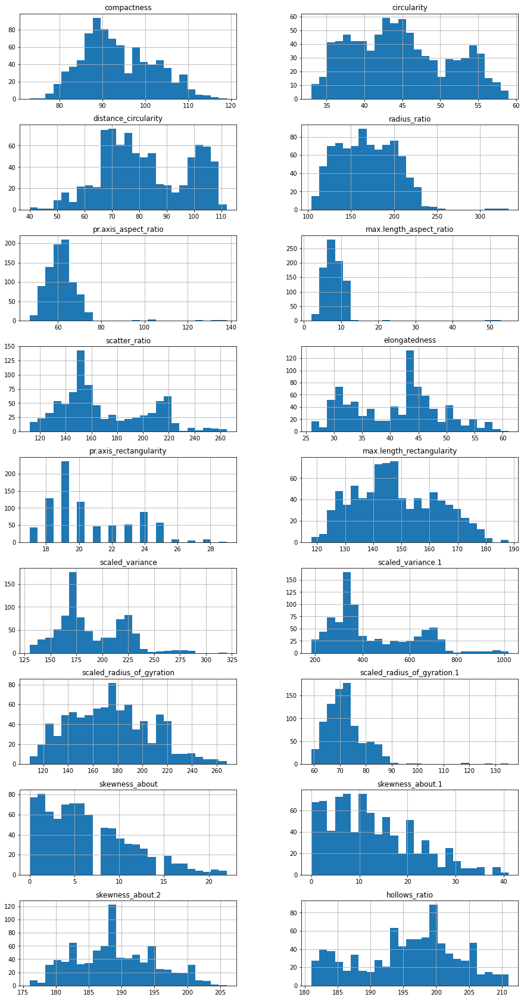

In [187]:
# Let's visualize distribution of the features with histogram.

columns = list(vhl)[0:-1] # Excluding Outcome column which has only 
vhl[columns].hist(stacked=False, bins=25, figsize=(15,30), layout=(9,2)); 
# Histogram of first 8 columns

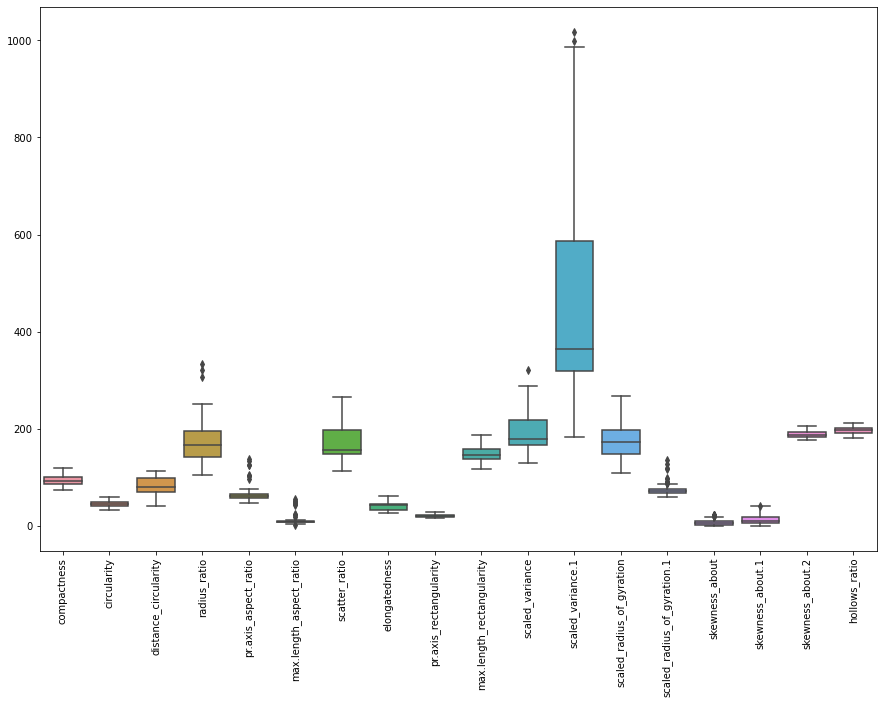

In [188]:
plt.figure(figsize=(15,10))
plt.xticks(rotation='vertical')
sns.boxplot(data=vhl);

The above boxplot shows us that there are outliers in some features. We have to treat them to do analysis.

In [189]:
# Lets calculate the lower & upper bound of of data distribution for outlier treatment.

Q1 = vhl.quantile(0.25)
Q3 = vhl.quantile(0.75)
IQR = Q3-Q1
Lower_bound = Q1-(1.5*IQR)
Upper_bound = Q3+(1.5*IQR)
print("Minimum values are:\n",vhl.min())
print("\nLower bound values are: \n",Lower_bound)
print("\nMaximum values are: \n",vhl.max())
print("\nUpper bound values are: \n",Upper_bound)

Minimum values are:
 compactness                       73
circularity                     33.0
distance_circularity            40.0
radius_ratio                   104.0
pr.axis_aspect_ratio            47.0
max.length_aspect_ratio            2
scatter_ratio                  112.0
elongatedness                   26.0
pr.axis_rectangularity          17.0
max.length_rectangularity        118
scaled_variance                130.0
scaled_variance.1              184.0
scaled_radius_of_gyration      109.0
scaled_radius_of_gyration.1     59.0
skewness_about                   0.0
skewness_about.1                 0.0
skewness_about.2               176.0
hollows_ratio                    181
class                            bus
dtype: object

Lower bound values are: 
 compactness                     67.500
circularity                     26.500
distance_circularity            28.000
radius_ratio                    60.000
pr.axis_aspect_ratio            45.000
max.length_aspect_ratio          2.500
s

In [190]:
vhl.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus


In [191]:
# Replace the all outlier values to median value.

vhl["max.length_aspect_ratio"] = np.where(vhl["max.length_aspect_ratio"]<Lower_bound["max.length_aspect_ratio"],vhl["max.length_aspect_ratio"].median(),vhl["max.length_aspect_ratio"])
vhl["radius_ratio"] = np.where(vhl["radius_ratio"]>Upper_bound["radius_ratio"],vhl["radius_ratio"].median(),vhl["radius_ratio"])
vhl["pr.axis_aspect_ratio"] = np.where(vhl["pr.axis_aspect_ratio"]>Upper_bound["pr.axis_aspect_ratio"],vhl["pr.axis_aspect_ratio"].median(),vhl["pr.axis_aspect_ratio"])
vhl["max.length_aspect_ratio"] = np.where(vhl["max.length_aspect_ratio"]>Upper_bound["max.length_aspect_ratio"],vhl["max.length_aspect_ratio"].median(),vhl["max.length_aspect_ratio"])
vhl["scaled_variance"] = np.where(vhl["scaled_variance"]>Upper_bound["scaled_variance"],vhl["scaled_variance"].median(),vhl["scaled_variance"])
vhl["scaled_variance.1"] = np.where(vhl["scaled_variance.1"]>Upper_bound["scaled_variance.1"],vhl["scaled_variance.1"].median(),vhl["scaled_variance.1"])
vhl["scaled_radius_of_gyration.1"] = np.where(vhl["scaled_radius_of_gyration.1"]>Upper_bound["scaled_radius_of_gyration.1"],vhl["scaled_radius_of_gyration.1"].median(),vhl["scaled_radius_of_gyration.1"])
vhl["skewness_about"] = np.where(vhl["skewness_about"]>Upper_bound["skewness_about"],vhl["skewness_about"].median(),vhl["skewness_about"])
vhl["skewness_about.1"] = np.where(vhl["skewness_about.1"]>Upper_bound["skewness_about.1"],vhl["skewness_about.1"].median(),vhl["skewness_about.1"])


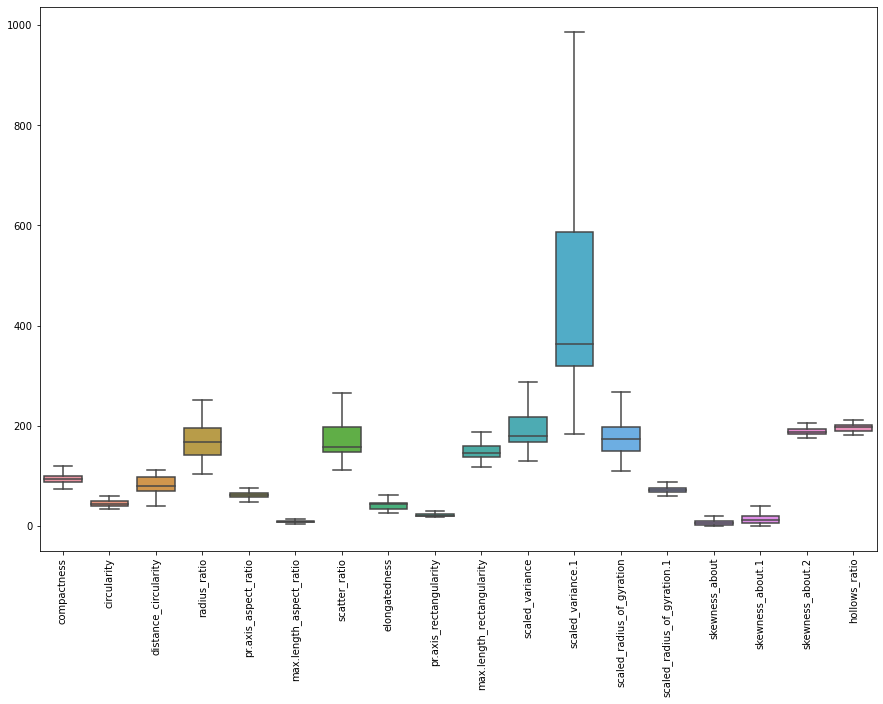

In [192]:
# Lets check the data distribution again.
plt.figure(figsize=(15,10))
plt.xticks(rotation='vertical')
sns.boxplot(data=vhl);

#### C. Visualize a Pie-chart and print percentage of values for variable ‘class’. 

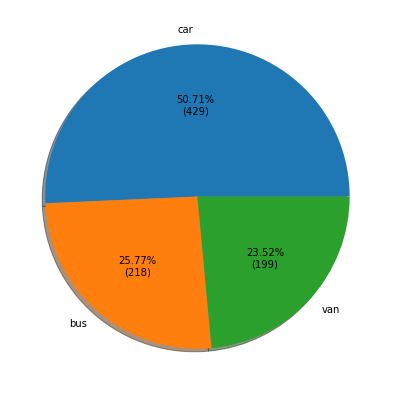

In [193]:
# Visualizing Pie-chart for "class" feature.

def my_fmt(x):
    return '{:.2f}%\n({:.0f})'.format(x, total*x/100)

values = vhl["class"]
v_counts = vhl["class"].value_counts()
total = len(vhl["class"])
fig = plt.figure(figsize =(10, 7))
plt.pie(v_counts, labels=v_counts.index, autopct=my_fmt, shadow=True);

Above pie-chart shows that dataset is imbalanced. We have to balance the dataset to get better prediction.

### Balance the dataset

In [194]:
Vhl_X = vhl[(vhl["class"] =="car")]
Vhl_X.shape

(429, 19)

In [195]:
Vhl_Y = vhl[(vhl["class"]=="bus")]
Vhl_Y.shape

(218, 19)

In [196]:
Vhl_Z = vhl[(vhl["class"]=="van")]
Vhl_Z.shape

(199, 19)

In [197]:
# To balance the data we have to do upsampling the Vhl_Y & Vhl_Z.

from sklearn.utils import resample

Vhl_Y1 = resample(Vhl_Y,replace=True,n_samples=len(Vhl_X),random_state=42)
Vhl_Z1 = resample(Vhl_Z,replace=True,n_samples=len(Vhl_X),random_state=42)

print(Vhl_Y1.shape)
print(Vhl_Z1.shape)

(429, 19)
(429, 19)


In [198]:
# Concatnating the datasets.
df1 = [Vhl_X,Vhl_Y1,Vhl_Z1]
df_new = pd.concat(df1,ignore_index = True)

In [199]:
df_new.shape

(1287, 19)

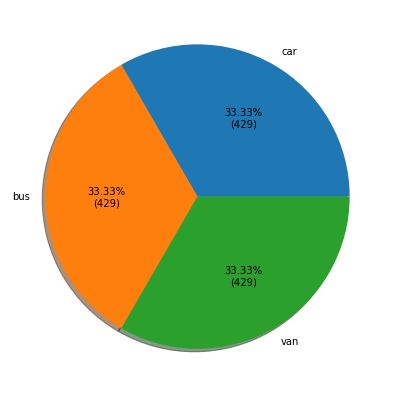

In [200]:
#Visualize the balanced dataset

def my_fmt(x):
    return '{:.2f}%\n({:.0f})'.format(x, total*x/100)

values = df_new["class"]
v_counts = df_new["class"].value_counts()
total = len(df_new["class"])
fig = plt.figure(figsize =(10, 7))
plt.pie(v_counts, labels=v_counts.index, autopct=my_fmt, shadow=True);

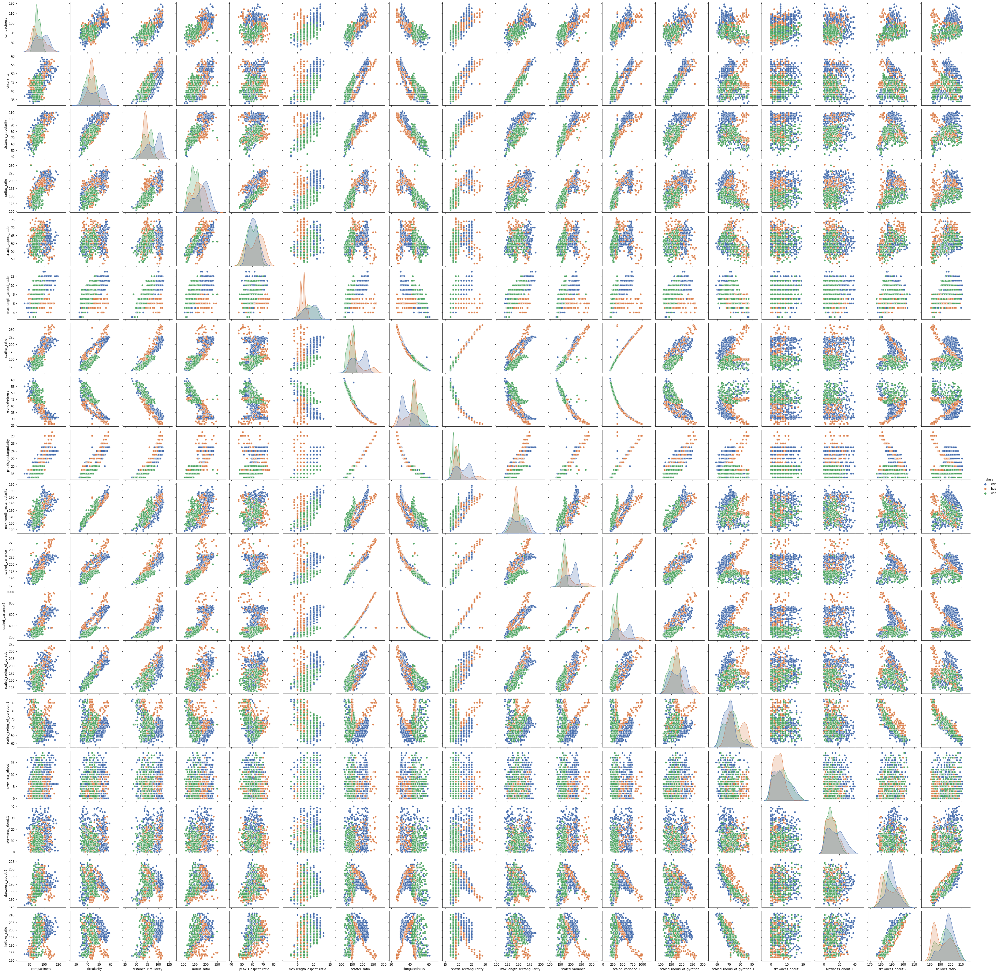

In [201]:
# Visualize the dataframe features with pairplot

sns.pairplot(df_new,hue="class",palette="deep");

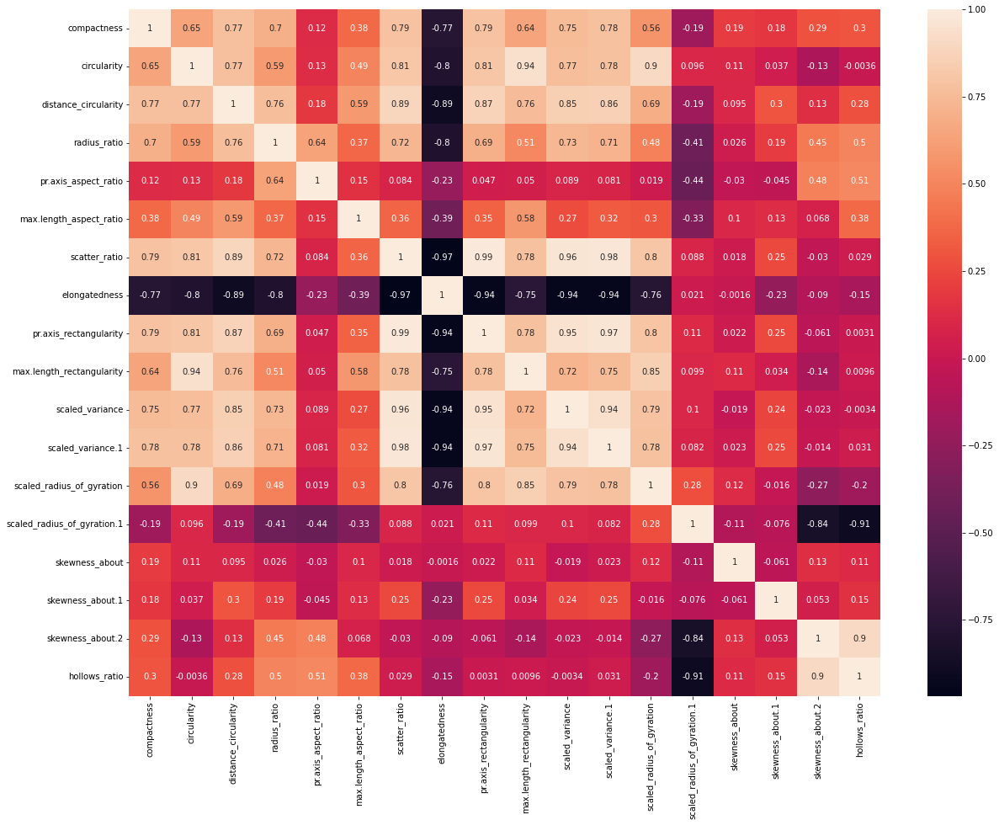

In [202]:
# Lets visuvalize the correlations of the features with Heatmap.
plt.figure(figsize=(20,15))
sns.heatmap(df_new.corr(),annot=True);

#### D. Check for duplicate rows in the data and impute with correct approach.

In [203]:
# Lets check the duplicated values in the dataframe

Vhl_duplicates = vhl.duplicated()
Vhl_duplicates.sum()

0

There is no duplicate values in the dataframe.

### 2. Data Preparation:

#### A. Split data into X and Y. [Train and Test optional]

In [204]:
# Split the dataset into two variable.

X = df_new.iloc[:,:-1]
Y = df_new.iloc[:,-1]

In [205]:
X.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
0,104,50.0,106.0,209.0,66.0,10.0,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196
1,93,44.0,98.0,167.0,62.0,11.0,183.0,36.0,22.0,146,202.0,505.0,152.0,64.0,4.0,14.0,195.0,204
2,90,34.0,66.0,136.0,55.0,6.0,123.0,54.0,17.0,118,148.0,224.0,118.0,65.0,5.0,26.0,196.0,202
3,96,55.0,103.0,201.0,65.0,9.0,204.0,32.0,23.0,166,227.0,624.0,246.0,74.0,6.0,2.0,186.0,194
4,104,54.0,100.0,186.0,61.0,10.0,216.0,31.0,24.0,173,225.0,686.0,220.0,74.0,5.0,11.0,185.0,195


In [206]:
Y.head()

0    car
1    car
2    car
3    car
4    car
Name: class, dtype: object

#### B. Standardize the Data.

In [207]:
# Standardize the dependent features to nullify the units.

Xscaled = X.apply(zscore)

Xscaled.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
0,1.436656,1.003608,1.759289,1.514152,0.855362,1.055499,1.306714,-1.321887,1.078318,0.797039,1.231948,1.280540,1.482772,0.053503,1.761824,-0.326116,-0.091930,0.146368
1,0.020211,-0.053095,1.228113,0.141013,0.174248,1.559928,0.576237,-0.800025,0.690449,-0.093661,0.565137,0.530540,-0.659416,-1.358183,-0.480307,0.280053,0.996368,1.182826
2,-0.366093,-1.814267,-0.896592,-0.872495,-1.017702,-0.962217,-1.249956,1.548351,-1.248896,-2.171961,-1.149519,-1.090612,-1.730511,-1.201329,-0.256094,1.734857,1.151839,0.923711
3,0.406514,1.884194,1.560098,1.252602,0.685083,0.551070,1.215405,-1.321887,1.078318,1.390840,1.358960,1.217078,2.301844,0.210358,-0.031881,-1.174751,-0.402872,-0.112746
4,1.436656,1.708077,1.360907,0.762195,0.003969,1.055499,1.580643,-1.452352,1.466187,1.910415,1.295454,1.574770,1.482772,0.210358,-0.256094,-0.083648,-0.558343,0.016811


### 3. Model Building:

#### A. Train a base Classification model using SVM.

In [208]:
# Lets import the necessory packages from sklearn library.

from sklearn.svm import SVC

from sklearn import metrics 
from sklearn.metrics import accuracy_score
from sklearn.metrics import log_loss
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score

In [209]:
X_train, X_test, y_train, y_test = train_test_split(Xscaled,Y, test_size = 0.20,random_state=42) 
# test_size = 0.2 is 20% of the data for testing.

In [210]:
y_train.count()

1029

In [211]:
y_test.count()

258

In [212]:
#Train a model for Support Vector Classifier model
SVC_model1 = SVC()
SVC_model1.fit(X_train, y_train)

#Predict for train data.
SVC_predict1 = SVC_model1.predict(X_train)

# check the accuracy on the training set
print("The SVC training data score is %f" % (SVC_model1.score(X_train, y_train)))
print("The SVC testing data score is %f" % (SVC_model1.score(X_test, y_test)))

The SVC training data score is 0.974733
The SVC testing data score is 0.965116


#### B. Print Classification metrics for train data

Accuracy Score is 0.9747327502429544
Recall Score is 0.9747327502429544
Precision Score is 0.9757604318953955

Classification Report : 
              precision    recall  f1-score   support

         bus       0.99      0.99      0.99       339
         car       0.94      1.00      0.97       318
         van       1.00      0.94      0.97       372

    accuracy                           0.97      1029
   macro avg       0.97      0.98      0.97      1029
weighted avg       0.98      0.97      0.97      1029



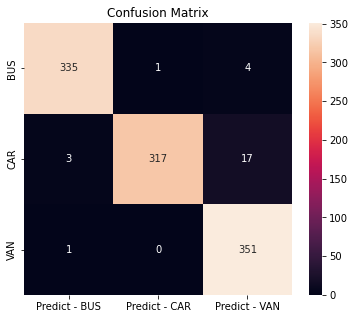

In [213]:
# check the performance of the model for train data
# check the performance of the model for train data
Acc = accuracy_score(y_train, SVC_predict1)
Recall = recall_score(y_train, SVC_predict1,average='weighted')
Prec = precision_score(y_train, SVC_predict1,average='weighted')

print ('Accuracy Score is',Acc)
print ('Recall Score is',Recall)
print ('Precision Score is',Prec)

print ('\nClassification Report : ')
print (classification_report(SVC_predict1, y_train))

# Confusion Matrix
cm=metrics.confusion_matrix(y_train, SVC_predict1, labels=["bus", "car","van"])

df_cm = pd.DataFrame(cm, index = [i for i in ["BUS", "CAR","VAN"]],
                  columns = [i for i in ["Predict - BUS","Predict - CAR", "Predict - VAN"]])
plt.figure(figsize = (6,5))
plt.title("Confusion Matrix")
sns.heatmap(df_cm, annot=True, fmt="d");

#### C. Apply PCA on the data with 10 components.

In [214]:
# Print Covariance Matrix.

covMatrix = np.cov(Xscaled,rowvar=False)
print(covMatrix)

[[ 1.0007776   0.64623926  0.77249821  0.70074596  0.12324287  0.38378144
   0.79305531 -0.76812829  0.79063136  0.64228869  0.75426892  0.78399562
   0.56391858 -0.1915159   0.1942585   0.17767366  0.28775466  0.29878264]
 [ 0.64623926  1.0007776   0.77082332  0.59332077  0.1261133   0.49468287
   0.81541754 -0.79691635  0.80642824  0.94560101  0.76662099  0.78179382
   0.90388894  0.09565209  0.10586869  0.03666401 -0.12654564 -0.00363113]
 [ 0.77249821  0.77082332  1.0007776   0.7645468   0.1819781   0.59166535
   0.88618229 -0.89466095  0.8734813   0.76209351  0.84794088  0.86018715
   0.6902254  -0.19225358  0.09546788  0.29815211  0.13397865  0.28256244]
 [ 0.70074596  0.59332077  0.7645468   1.0007776   0.63756435  0.37345797
   0.72533862 -0.802775    0.69329504  0.51509687  0.73330828  0.71224487
   0.48515563 -0.40715994  0.02634207  0.19333459  0.44997595  0.49875628]
 [ 0.12324287  0.1261133   0.1819781   0.63756435  1.0007776   0.15089631
   0.08370098 -0.22581742  0.04671

In [215]:
from sklearn.decomposition import PCA #Import library

# Applying PCA with 10 components
pca = PCA(n_components=10, random_state=42)
pca.fit(Xscaled)

PCA(n_components=10, random_state=42)

In [216]:
# The eigen Values

print("The eigen values are \n",pca.explained_variance_)

The eigen values are 
 [9.33343379 3.62394697 1.28157663 1.10197046 0.95846559 0.6395342
 0.32252259 0.23274682 0.1296405  0.08027323]


In [217]:
# The eigen Vectors

print("\n The eigen vectors are \n",pca.components_)


 The eigen vectors are 
 [[ 0.27231733  0.2886907   0.30609162  0.26151168  0.065102    0.16214997
   0.31743177 -0.31543506  0.31364353  0.27961903  0.3061178   0.31042158
   0.27025895 -0.0161055   0.02624331  0.0739403   0.02289169  0.05494994]
 [-0.09190418  0.09608135 -0.0641707  -0.23986694 -0.32378614 -0.1321353
   0.07120628  0.00080003  0.08679273  0.10012502  0.07588618  0.06722932
   0.19375708  0.48862573 -0.05985471 -0.0533319  -0.48351849 -0.49894827]
 [-0.01408855 -0.24144187  0.00137641  0.1259438   0.028121   -0.36722408
   0.12259586 -0.12097222  0.1156991  -0.29554842  0.17859494  0.13719554
  -0.19180233  0.07249203 -0.54140121  0.51910597  0.04883611 -0.04320728]
 [ 0.11626655 -0.0868319   0.14049644 -0.23310737 -0.53627795  0.29962461
   0.00639403  0.06836202  0.02772645  0.00654138 -0.05274268  0.00359473
  -0.14115101 -0.0983842   0.33171187  0.6075916  -0.03000472  0.09731859]
 [ 0.23758798 -0.13046819 -0.0866214   0.04590162 -0.09375895 -0.60537737
   0.0753

In [218]:
# The percentage of variation explained by each eigen Vector

print(pca.explained_variance_ratio_)

[0.51812121 0.20117395 0.07114338 0.06117301 0.05320671 0.03550207
 0.017904   0.01292033 0.00719665 0.00445616]


#### D. Visualize Cumulative Variance Explained with Number of Components. 

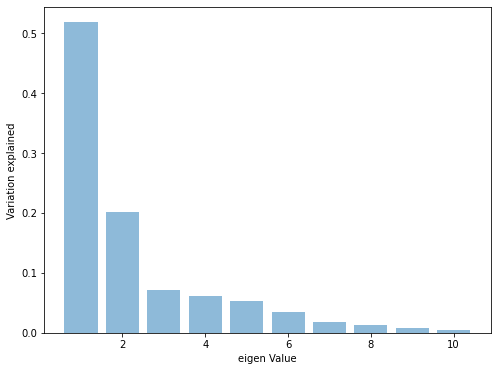

In [219]:
#Variation explained with No. of componenets 

plt.figure(figsize=(8,6))
plt.bar(list(range(1,11)),pca.explained_variance_ratio_,alpha=0.5, align='center')
plt.ylabel('Variation explained')
plt.xlabel('eigen Value')
plt.show()

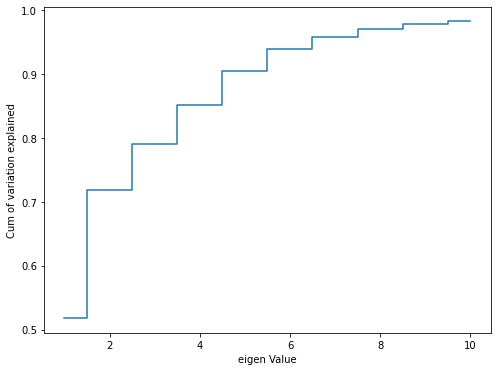

In [220]:
#Cumulative variation explained with no. of componenets 
plt.figure(figsize=(8,6))
plt.step(list(range(1,11)),np.cumsum(pca.explained_variance_ratio_), where='mid')
plt.ylabel('Cum of variation explained')
plt.xlabel('eigen Value')
plt.show()

#### E. Draw a horizontal line on the above plot to highlight the threshold of 90%

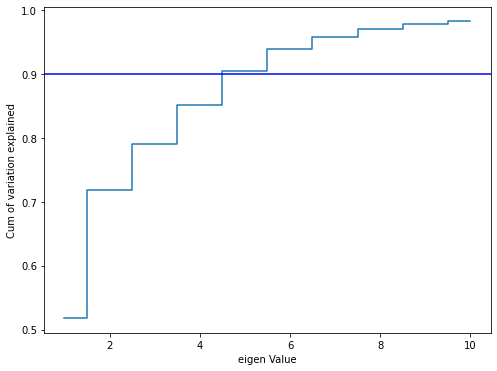

In [221]:
plt.figure(figsize=(8,6))
plt.step(list(range(1,11)),np.cumsum(pca.explained_variance_ratio_), where='mid')
plt.ylabel('Cum of variation explained')
plt.xlabel('eigen Value')
plt.axhline(y = 0.9, color = 'b', linestyle = '-')
plt.show()

### *Dimensionality Reduction*

With above plot we can see that 6 dimensions seems very reasonable. With 6 variables we can explain over 94% of the variation in the original data!

#### F. Apply PCA on the data. This time Select Minimum Components with 90% or above variance explained. 

In [222]:
pca6 = PCA(n_components=6)
pca6.fit(Xscaled)
print(pca6.components_)
print(pca6.explained_variance_ratio_)
Xpca6 = pca6.transform(Xscaled)

[[ 0.27231733  0.2886907   0.30609162  0.26151168  0.065102    0.16214997
   0.31743177 -0.31543506  0.31364353  0.27961903  0.3061178   0.31042158
   0.27025895 -0.0161055   0.02624331  0.0739403   0.02289169  0.05494994]
 [-0.09190418  0.09608135 -0.0641707  -0.23986694 -0.32378614 -0.1321353
   0.07120628  0.00080003  0.08679273  0.10012502  0.07588618  0.06722932
   0.19375708  0.48862573 -0.05985471 -0.0533319  -0.48351849 -0.49894827]
 [-0.01408855 -0.24144187  0.00137641  0.1259438   0.028121   -0.36722408
   0.12259586 -0.12097222  0.1156991  -0.29554842  0.17859494  0.13719554
  -0.19180233  0.07249203 -0.54140121  0.51910597  0.04883611 -0.04320728]
 [ 0.11626655 -0.0868319   0.14049644 -0.23310737 -0.53627795  0.29962461
   0.00639403  0.06836202  0.02772645  0.00654138 -0.05274268  0.00359473
  -0.14115101 -0.0983842   0.33171187  0.6075916  -0.03000472  0.09731859]
 [ 0.23758798 -0.13046819 -0.0866214   0.04590162 -0.09375895 -0.60537737
   0.07532278 -0.03979135  0.077673

In [223]:
print(Xpca6)

[[ 4.43766333 -0.28636032 -1.24245102 -0.086911    0.90613642  0.85547429]
 [ 1.57014864 -2.06216713  0.34373897  0.7829568  -1.04009315 -0.73297462]
 [-4.1726455  -2.00868965  1.75915347  1.94250928  0.55563718 -0.50434044]
 ...
 [-1.57088737 -1.18880934  0.22497421 -0.86715122 -1.35185871 -0.57177122]
 [ 0.71404131  0.29883711 -0.72272734  0.23915484 -2.17949057  0.67370228]
 [-4.87819064  2.41903941 -0.21283115 -0.12208394  0.97071467 -0.31823793]]


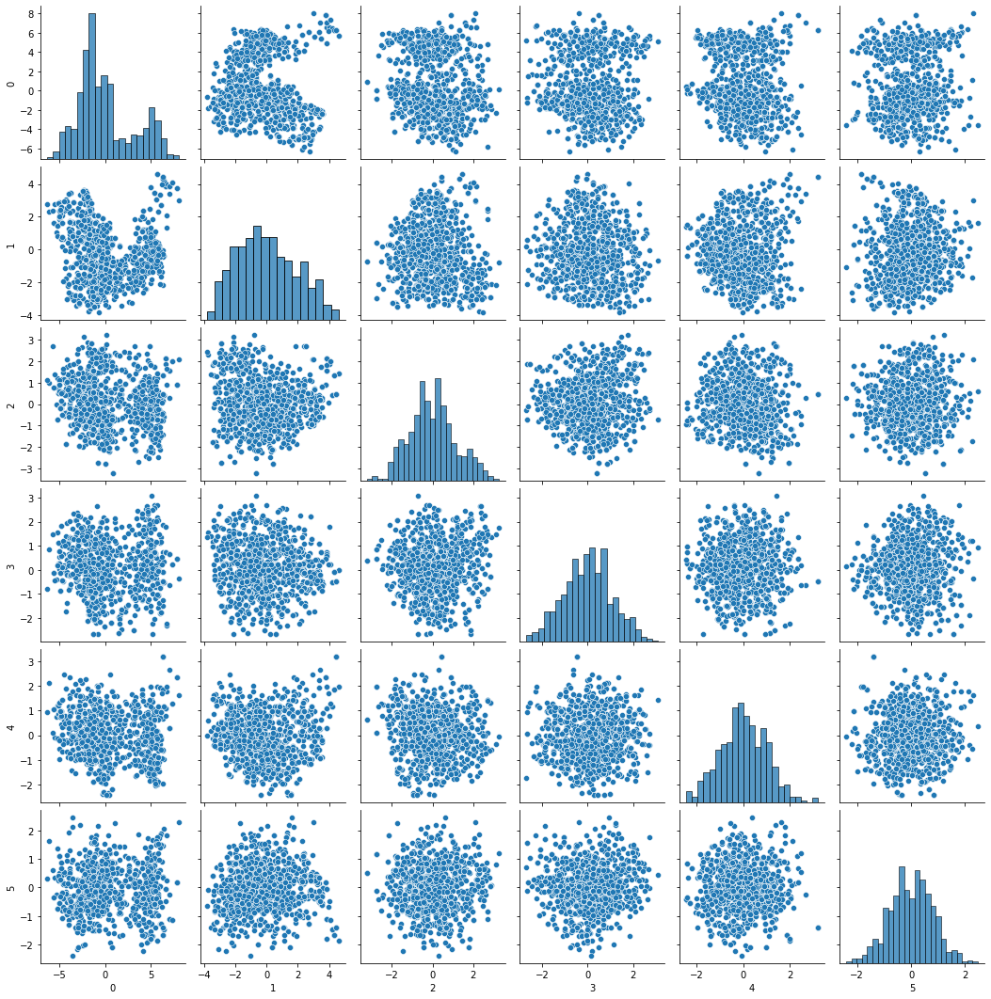

In [224]:
# Visualize the PCA features with Pairplot.
sns.pairplot(pd.DataFrame(Xpca6));

#### G. Train SVM model on components selected from above step

In [225]:
X2 = pd.DataFrame(Xpca6)
X2.shape

(1287, 6)

In [226]:
# train & split the data
X2_train,X2_test,Y2_train,Y2_test = train_test_split(X2,Y, test_size = 0.20,random_state=42) 

In [227]:
X2_train.shape

(1029, 6)

In [228]:
X2_test.shape

(258, 6)

In [229]:
#Train a model for Support Vector Classifier model
SVC_model2 = SVC()
SVC_model2.fit(X2_train, Y2_train)

#Predict for train data
SVC_predict2 = SVC_model2.predict(X2_train)

# check the accuracy on the training set
print("The SVC training data score is %f" % (SVC_model2.score(X2_train, Y2_train)))
print("The SVC testing data score is %f" % (SVC_model2.score(X2_test, Y2_test)))

The SVC training data score is 0.943635
The SVC testing data score is 0.922481


#### H. Print Classification metrics for train data of above model and share insights.

Accuracy Score is 0.9436345966958212
Recall Score is 0.9436345966958212
Precision Score is 0.9457260508976678

Classification Report : 
              precision    recall  f1-score   support

         bus       0.97      0.96      0.97       342
         car       0.88      0.97      0.93       306
         van       0.97      0.90      0.94       381

    accuracy                           0.94      1029
   macro avg       0.94      0.95      0.94      1029
weighted avg       0.95      0.94      0.94      1029


Confusion Matrix


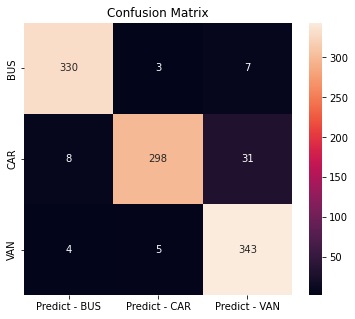

In [230]:
# check the performance of the model for train data
acc1 = accuracy_score(Y2_train, SVC_predict2)
recall1 = recall_score(Y2_train, SVC_predict2,average='weighted')
prec1 = precision_score(Y2_train, SVC_predict2,average='weighted')

print ('Accuracy Score is',acc1)
print ('Recall Score is',recall1)
print ('Precision Score is',prec1)
print ('\nClassification Report : ')
print (classification_report(SVC_predict2, Y2_train))

print("\nConfusion Matrix")
cm=metrics.confusion_matrix(Y2_train, SVC_predict2, labels=["bus", "car","van"])

df_cm = pd.DataFrame(cm, index = [i for i in ["BUS", "CAR","VAN"]],
                  columns = [i for i in ["Predict - BUS","Predict - CAR", "Predict - VAN"]])
plt.figure(figsize = (6,5))
plt.title("Confusion Matrix")
sns.heatmap(df_cm, annot=True, fmt="d");

In [231]:
# Performance comparing of the Base model & PCA model.

Data = {"Accuracy":[Acc,acc1], "Recall":[Recall,recall1], "Precision":[Prec,prec1]}
Column = ["Base_model", "PCA_model"]
matrix_df = pd.DataFrame.from_dict(Data, orient ='index',columns = Column) 
matrix_df["Perform_loss"] = matrix_df["Base_model"] - matrix_df["PCA_model"]
matrix_df

,Base_model,PCA_model,Perform_loss
Accuracy,0.974733,0.943635,0.031098
Recall,0.974733,0.943635,0.031098
Precision,0.975760,0.945726,0.030034


In [232]:
print("Percentage of model performance loss: \n \n",round(matrix_df["Perform_loss"]*100,2))

Percentage of model performance loss: 
 
 Accuracy     3.11
Recall       3.11
Precision    3.00
Name: Perform_loss, dtype: float64


**Looks like by drop reducing dimensionality by 6, we only dropped around 3% performence in Classification metrics.**

### 4. Performance Improvement: 

#### A. Train another SVM on the components out of PCA. Tune the parameters to improve performance. 

In [233]:
# Import the library
from sklearn.model_selection import GridSearchCV
  
# defining parameter range
param_grid = {'C': [0.1, 1, 10, 100, 1000], 
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf']} 
  
grid = GridSearchCV(SVC(), param_grid, refit = True, verbose = 3)
  
# fitting the model for grid search
grid.fit(X2_train, Y2_train)

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.519 total time=   0.0s
[CV 2/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.592 total time=   0.0s
[CV 3/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.573 total time=   0.0s
[CV 4/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.592 total time=   0.0s
[CV 5/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.566 total time=   0.0s
[CV 1/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.859 total time=   0.0s
[CV 2/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.864 total time=   0.0s
[CV 3/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.888 total time=   0.0s
[CV 4/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.888 total time=   0.0s
[CV 5/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.868 total time=   0.0s
[CV 1/5] END .....C=0.1, gamma=0.01, kernel=rbf;, score=0.816 total time=   0.0s
[CV 2/5] END .....C=0.1, gamma=0.01, kernel=rbf

[CV 3/5] END .......C=1000, gamma=1, kernel=rbf;, score=0.956 total time=   0.0s
[CV 4/5] END .......C=1000, gamma=1, kernel=rbf;, score=0.961 total time=   0.0s
[CV 5/5] END .......C=1000, gamma=1, kernel=rbf;, score=0.912 total time=   0.0s
[CV 1/5] END .....C=1000, gamma=0.1, kernel=rbf;, score=0.947 total time=   0.0s
[CV 2/5] END .....C=1000, gamma=0.1, kernel=rbf;, score=0.937 total time=   0.0s
[CV 3/5] END .....C=1000, gamma=0.1, kernel=rbf;, score=0.971 total time=   0.0s
[CV 4/5] END .....C=1000, gamma=0.1, kernel=rbf;, score=0.956 total time=   0.0s
[CV 5/5] END .....C=1000, gamma=0.1, kernel=rbf;, score=0.941 total time=   0.0s
[CV 1/5] END ....C=1000, gamma=0.01, kernel=rbf;, score=0.927 total time=   0.0s
[CV 2/5] END ....C=1000, gamma=0.01, kernel=rbf;, score=0.951 total time=   0.0s
[CV 3/5] END ....C=1000, gamma=0.01, kernel=rbf;, score=0.966 total time=   0.0s
[CV 4/5] END ....C=1000, gamma=0.01, kernel=rbf;, score=0.942 total time=   0.0s
[CV 5/5] END ....C=1000, gam

GridSearchCV(estimator=SVC(),
             param_grid={'C': [0.1, 1, 10, 100, 1000],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                         'kernel': ['rbf']},
             verbose=3)

#### B. Share best Parameters observed from above step.

In [234]:
# print best parameter after tuning
print("Best Parameters are:",grid.best_params_,"\n")

# print how our model looks after hyper-parameter tuning
print("Best Estimators are :",grid.best_estimator_)

Best Parameters are: {'C': 100, 'gamma': 0.1, 'kernel': 'rbf'} 

Best Estimators are : SVC(C=100, gamma=0.1)


In [235]:
#Train a model for Support Vector Classifier model with best estimators.
SVC_model3 = SVC(C=100, gamma=0.1, kernel='rbf')
SVC_model3.fit(X2_train, Y2_train)

#Predict for train data
SVC_predict3 = SVC_model3.predict(X2_train)

# check the accuracy on the training set
print("The SVC training data score is %f" %(SVC_model3.score(X2_train, Y2_train)))
print("The SVC testing data score is %f" %(SVC_model3.score(X2_test, Y2_test)))

The SVC training data score is 0.996113
The SVC testing data score is 0.941860


#### C. Print Classification metrics for train data of above model and share relative improvement in performance in all the models along with insights.

Accuracy Score is 0.9961127308066083
Recall Score is 0.9961127308066083
Precision Score is 0.9961152848634066

Classification Report : 
              precision    recall  f1-score   support

         bus       1.00      1.00      1.00       341
         car       0.99      1.00      0.99       335
         van       1.00      0.99      1.00       353

    accuracy                           1.00      1029
   macro avg       1.00      1.00      1.00      1029
weighted avg       1.00      1.00      1.00      1029


Confusion Matrix


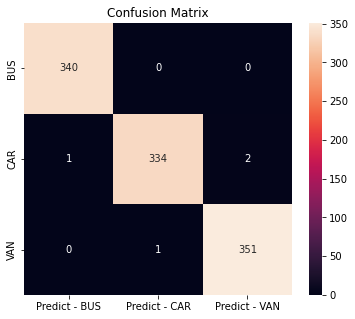

In [236]:
# check the performance of the model for train data
acc2 = accuracy_score(Y2_train, SVC_predict3)
recall2 = recall_score(Y2_train, SVC_predict3,average='weighted')
prec2 = precision_score(Y2_train, SVC_predict3,average='weighted')

print ('Accuracy Score is',acc2)
print ('Recall Score is',recall2)
print ('Precision Score is',prec2)

print ('\nClassification Report : ')
print (classification_report(SVC_predict3, Y2_train))

print("\nConfusion Matrix")
cm=metrics.confusion_matrix(Y2_train, SVC_predict3, labels=["bus", "car","van"])

df_cm = pd.DataFrame(cm, index = [i for i in ["BUS", "CAR","VAN"]],
                  columns = [i for i in ["Predict - BUS","Predict - CAR", "Predict - VAN"]])
plt.figure(figsize = (6,5))
plt.title("Confusion Matrix")
sns.heatmap(df_cm, annot=True, fmt="d");

In [237]:
data = {"Accuracy":[Acc,acc1,acc2], "Recall":[Recall,recall1,recall2], "Precision":[Prec,prec1,prec2]}
column = ["Base_model","PCA_model", "Tuned_model"]
mat_df = pd.DataFrame.from_dict(data, orient ='index',columns = column) 
mat_df["Improvement"] = mat_df["Tuned_model"] - mat_df["PCA_model"]
mat_df

,Base_model,PCA_model,Tuned_model,Improvement
Accuracy,0.974733,0.943635,0.996113,0.052478
Recall,0.974733,0.943635,0.996113,0.052478
Precision,0.975760,0.945726,0.996115,0.050389


In [238]:
print("Percentage of model improvement \n \n ",round(mat_df["Improvement"]*100,2))

Percentage of model improvement 
 
  Accuracy     5.25
Recall       5.25
Precision    5.04
Name: Improvement, dtype: float64


**We have improved our model performance 5% by using hyperparameter tuning with "GridSearchCV" function.**

### 5. Data Understanding & Cleaning: 

### A. Explain pre-requisite/assumptions of PCA.

*There are some assumptions in PCA which are to be followed as they will lead to accurate functioning of this dimensionality reduction technique in ML. The assumptions in PCA are:*

• **There must be linearity in the data set, i.e. the variables combine in a linear manner to form the dataset. The variables exhibit relationships among themselves.**

• **PCA assumes that the principal component with high variance must be paid attention and the PCs with lower variance are disregarded as noise. Pearson correlation coefficient framework led to the origin of PCA, and there it was assumed first that the axes with high variance would only be turned into principal components.**




### B. Explain advantages and limitations of PCA. 

PCA is related to the set of operations in the Pearson correlation, so it inherits similar assumptions and limitations:

**PCA assumes a correlation between features.** If the features (or dimensions or columns, in tabular data) are not correlated, PCA will be unable to determine principal components.

**PCA is sensitive to the scale of the features.** Imagine we have two features - one takes values between 0 and 1000, while the other takes values between 0 and 1. PCA will be extremely biased towards the first feature being the first principle component, regardless of the actual maximum variance within the data. This is why it’s so important to standardize the values first.
PCA is not robust against outliers. Similar to the point above, the algorithm will be biased in datasets with strong outliers. This is why it is recommended to remove outliers before performing PCA.

**PCA assumes a linear relationship between features.** The algorithm is not well suited to capturing non-linear relationships. That’s why it’s advised to turn non-linear features or relationships between features into linear, using the standard methods such as log transforms.

**Technical implementations often assume no missing values.** When computing PCA using statistical software tools, they often assume that the feature set has no missing values (no empty rows). Be sure to remove those rows and/or columns with missing values, or impute missing values with a close approximation (e.g. the mean of the column).

### Advantages of PCA

**1. Removes Correlated Features:** In a real world scenario, this is very common that you get thousands of features in your dataset. You cannot run your algorithm on all the features as it will reduce the performance of your algorithm and it will not be easy to visualize that many features in any kind of graph. So, you MUST reduce the number of features in your dataset. 

You need to find out the correlation among the features (correlated variables). Finding correlation manually in thousands of features is nearly impossible, frustrating and time-consuming. PCA does this for you efficiently.

After implementing the PCA on your dataset, all the Principal Components are independent of one another. There is no correlation among them.

**2. Improves Algorithm Performance:** With so many features, the performance of your algorithm will drastically degrade. PCA is a very common way to speed up your Machine Learning algorithm by getting rid of correlated variables which don't contribute in any decision making. The training time of the algorithms reduces significantly with less number of features.

So, if the input dimensions are too high, then using PCA to speed up the algorithm is a reasonable choice. 

**3. Reduces Overfitting:** Overfitting mainly occurs when there are too many variables in the dataset. So, PCA helps in overcoming the overfitting issue by reducing the number of features.

**4. Improves Visualization:** It is very hard to visualize and understand the data in high dimensions. PCA transforms a high dimensional data to low dimensional data (2 dimension) so that it can be visualized easily. 

We can use 2D Scree Plot to see which Principal Components result in high variance and have more impact as compared to other Principal Components. 

Even the simplest IRIS dataset is 4 dimensional which is hard to visualize. We can use PCA to reduce it to 2 dimension for better visualization.  

Consider a situation where we have 50 features (p = 50). There can be p(p-1)/2 scatter plots i.e. 1225 plots possible to analyze the variable relationships. It would be a tedious job to perform exploratory analysis on this data. That is why, we have to use PCA to get rid of this problem.



### Disadvantages of PCA.

**1. Independent variables become less interpretable:** After implementing PCA on the dataset, your original features will turn into Principal Components. Principal Components are the linear combination of your original features. Principal Components are not as readable and interpretable as original features.

**2. Data standardization is must before PCA:** You must standardize your data before implementing PCA, otherwise PCA will not be able to find the optimal Principal Components. 

For instance, if a feature set has data expressed in units of Kilograms, Light years, or Millions, the variance scale is huge in the training set. If PCA is applied on such a feature set, the resultant loadings for features with high variance will also be large. Hence, principal components will be biased towards features with high variance, leading to false results.

Also, for standardization, all the categorical features are required to be converted into numerical features before PCA can be applied.

PCA is affected by scale, so you need to scale the features in your data before applying PCA. Use StandardScaler from Scikit Learn to standardize the dataset features onto unit scale (mean = 0 and standard deviation = 1) which is a requirement for the optimal performance of many Machine Learning algorithms.

**3. Information Loss:** Although Principal Components try to cover maximum variance among the features in a dataset, if we don't select the number of Principal Components with care, it may miss some information as compared to the original list of features.
